# **Import Libraried**

In [63]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, balanced_accuracy_score


## **Import Data**

In [64]:
import pandas as pd

file_path = "/content/sample_data/nearest-earth-objects(1910-2024).csv"

# Load the CSV file into a DataFrame
df = pd.read_csv(file_path)

# Display the first few rows
df.head()

# Display missing values before handling
print("Missing Values:\n", df.isnull().sum())

# Drop rows with missing values
df = df.dropna()

# Display missing values after handling
print("\nMissing Values After Handling:\n", df.isnull().sum())

# Display DataFrame info after cleaning
print("\n", df.info())

# Display first few rows to check the dataset
print("\n", df.head())


Missing Values:
 neo_id                     0
name                       0
absolute_magnitude        28
estimated_diameter_min    28
estimated_diameter_max    28
orbiting_body              0
relative_velocity          0
miss_distance              0
is_hazardous               0
dtype: int64

Missing Values After Handling:
 neo_id                    0
name                      0
absolute_magnitude        0
estimated_diameter_min    0
estimated_diameter_max    0
orbiting_body             0
relative_velocity         0
miss_distance             0
is_hazardous              0
dtype: int64
<class 'pandas.core.frame.DataFrame'>
Index: 338171 entries, 0 to 338198
Data columns (total 9 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   neo_id                  338171 non-null  int64  
 1   name                    338171 non-null  object 
 2   absolute_magnitude      338171 non-null  float64
 3   estimated_diameter_min  338171 

# Check for Missing Values




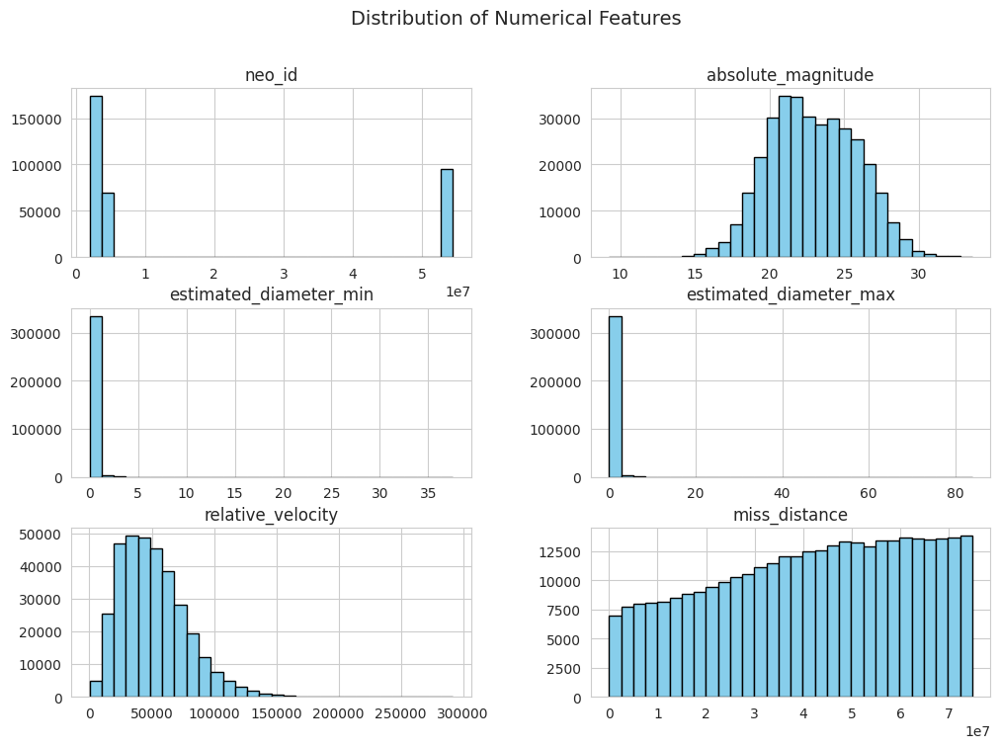

In [65]:
# Set style
sns.set_style("whitegrid")

# Create subplots for numerical features
df.hist(figsize=(12, 8), bins=30, edgecolor="black", color="skyblue")
plt.suptitle("Distribution of Numerical Features", fontsize=14)
plt.show()


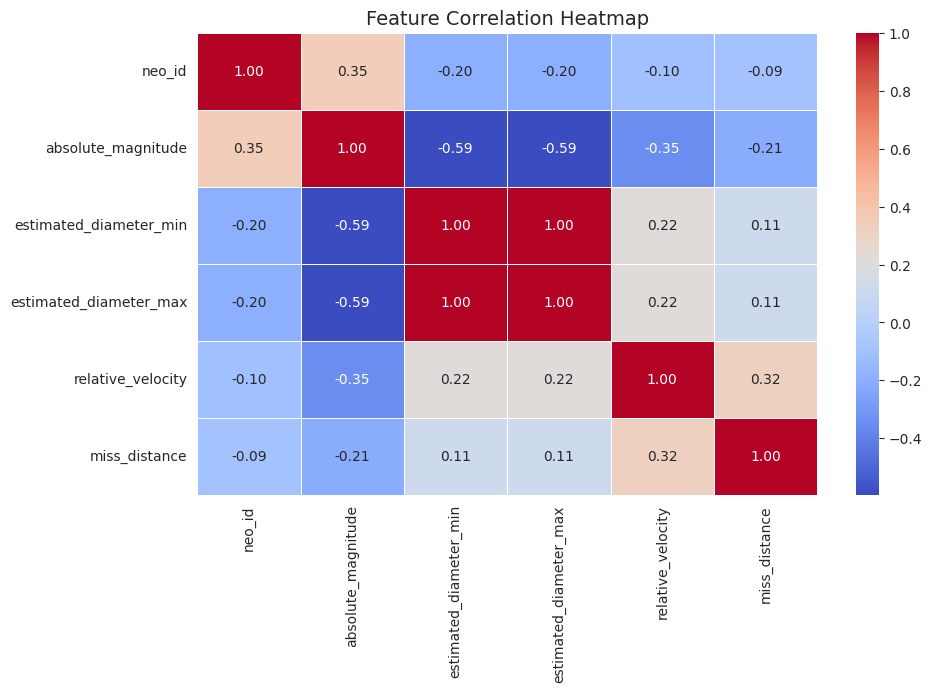

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure df contains only numerical columns for correlation
numeric_df = df.select_dtypes(include=["number"])

# Compute correlation
plt.figure(figsize=(10, 6))
sns.heatmap(numeric_df.corr(), annot=True, cmap="coolwarm", linewidths=0.5, fmt=".2f")

# Title
plt.title("Feature Correlation Heatmap", fontsize=14)
plt.show()


In [67]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px


# Load dataset
df = pd.read_csv("/content/sample_data/nearest-earth-objects(1910-2024).csv")  # Replace with your file path

# Set Seaborn style
sns.set_style("darkgrid")



# 1️⃣ Distribution of Absolute Magnitude


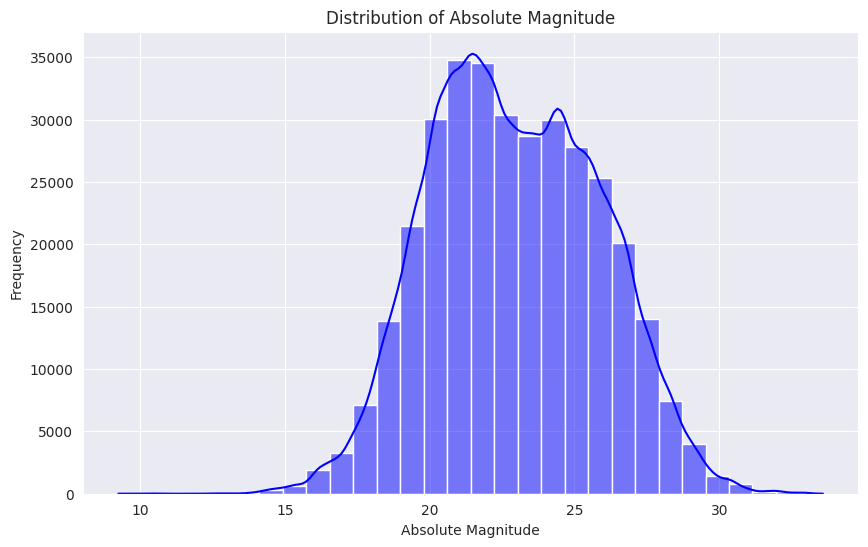

In [68]:
plt.figure(figsize=(10, 6))
sns.histplot(df["absolute_magnitude"], bins=30, kde=True, color="blue")
plt.title("Distribution of Absolute Magnitude")
plt.xlabel("Absolute Magnitude")
plt.ylabel("Frequency")
plt.show()

# 2️⃣ Scatter Plot: Absolute Magnitude vs. Estimated Diameter




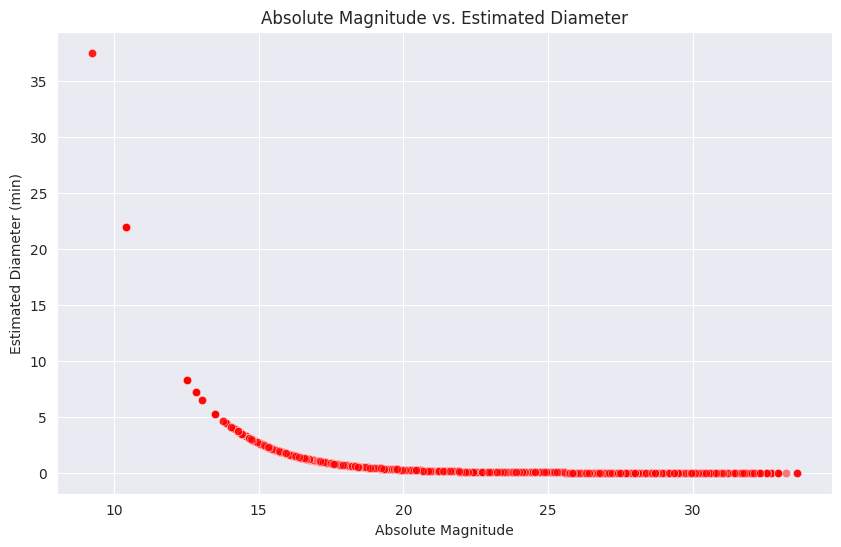

In [69]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df["absolute_magnitude"], y=df["estimated_diameter_min"], color="red", alpha=0.5)
plt.title("Absolute Magnitude vs. Estimated Diameter")
plt.xlabel("Absolute Magnitude")
plt.ylabel("Estimated Diameter (min)")
plt.show()



# 3️⃣ Boxplot of Relative Velocity


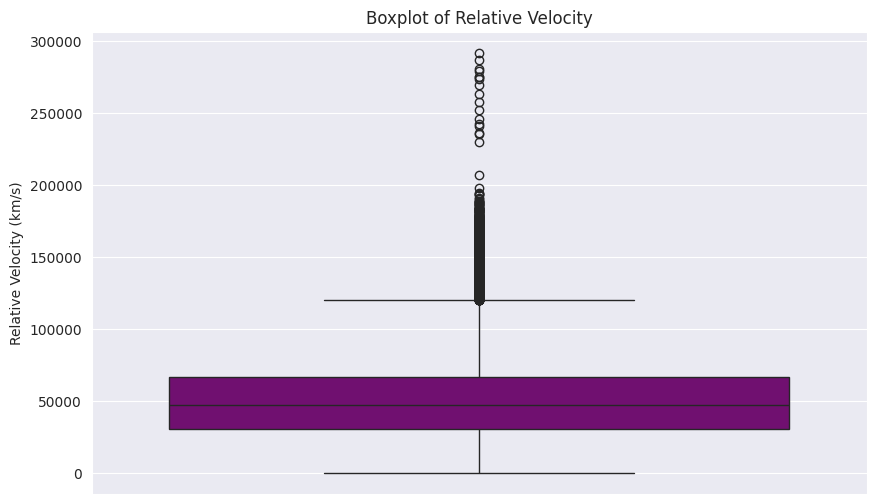

In [70]:


# 3️⃣ Boxplot of Relative Velocity
plt.figure(figsize=(10, 6))
sns.boxplot(y=df["relative_velocity"], color="purple")
plt.title("Boxplot of Relative Velocity")
plt.ylabel("Relative Velocity (km/s)")
plt.show()



# 4️⃣ Hazardous vs. Non-Hazardous Asteroids


<ipython-input-71-771a049841f4>:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




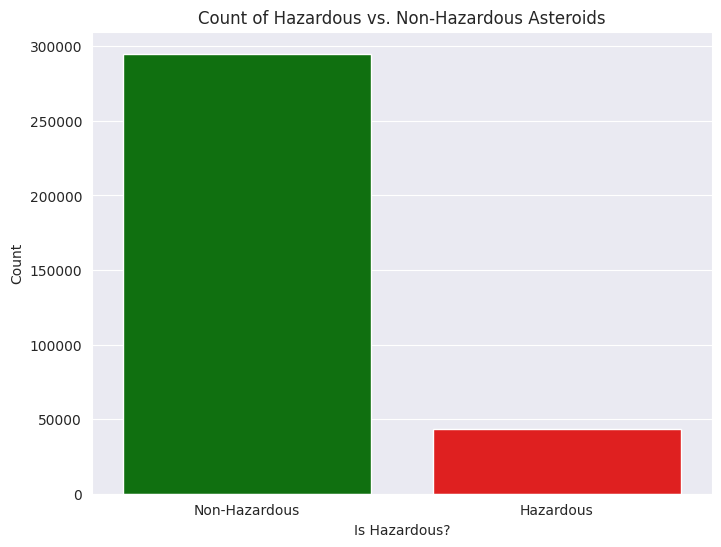

In [71]:
plt.figure(figsize=(8, 6))
sns.countplot(x=df["is_hazardous"], palette=["green", "red"])
plt.title("Count of Hazardous vs. Non-Hazardous Asteroids")
plt.xlabel("Is Hazardous?")
plt.ylabel("Count")
plt.xticks([0, 1], ["Non-Hazardous", "Hazardous"])
plt.show()


# 5️⃣ Interactive Scatter Plot with Plotly


In [72]:
fig = px.scatter(df, x="absolute_magnitude", y="relative_velocity", color="is_hazardous",
                 title="Absolute Magnitude vs. Relative Velocity (Interactive)",
                 labels={"absolute_magnitude": "Absolute Magnitude", "relative_velocity": "Relative Velocity (km/s)"},
                 hover_data=["name"])
fig.show()

In [73]:




# **1️⃣ Drop unnecessary columns**
df.drop(columns=["neo_id", "name", "orbiting_body"], errors='ignore', inplace=True)

# **2️⃣ Handle missing values**
df.fillna(df.median(), inplace=True)

# **3️⃣ Convert categorical target to numeric**
df["is_hazardous"] = df["is_hazardous"].astype(int)

# **4️⃣ Select features & target**
X = df.drop(columns=["is_hazardous"])
y = df["is_hazardous"]

# **5️⃣ Split data (before handling imbalance)**
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# **6️⃣ Normalize features**
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# **7️⃣ Handle Imbalance using SMOTE (Oversampling the minority class)**
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)




# **8️⃣ Train the Model (Using Class Weight Adjustment)**


In [74]:
model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced")
model.fit(X_train, y_train)



RandomForestClassifier(class_weight='balanced', random_state=42)



# **9️⃣ Make Predictions**


In [75]:

y_pred = model.predict(X_test)





# **🔹 Evaluate the Model**


In [76]:

print("Accuracy:", accuracy_score(y_test, y_pred))
print("Balanced Accuracy:", balanced_accuracy_score(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Accuracy: 0.9107776463630988
Balanced Accuracy: 0.82063752151104

Classification Report:
               precision    recall  f1-score   support

           0       0.96      0.94      0.95     59008
           1       0.64      0.70      0.67      8632

    accuracy                           0.91     67640
   macro avg       0.80      0.82      0.81     67640
weighted avg       0.91      0.91      0.91     67640





# **🔹 Confusion Matrix Visualization**


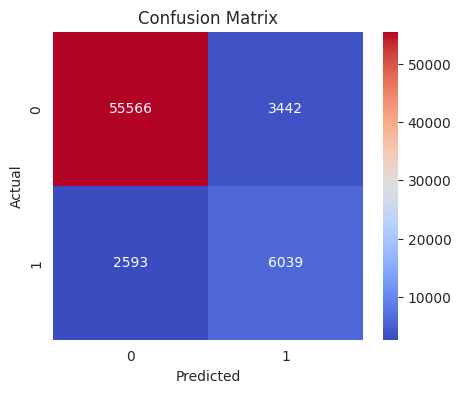

In [77]:

plt.figure(figsize=(5, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, fmt="d", cmap="coolwarm")
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.show()

##🔹Model Training and Evaluation:

In [78]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, roc_auc_score, roc_curve

# **1️⃣ Load Data**


# **2️⃣ Feature Selection & Preprocessing**
df.drop(columns=["neo_id", "name", "orbiting_body"], errors='ignore', inplace=True)
df.fillna(df.median(), inplace=True)
df["is_hazardous"] = df["is_hazardous"].astype(int)

X = df.drop(columns=["is_hazardous"])
y = df["is_hazardous"]

# **3️⃣ Train-Test Split**
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# **4️⃣ Normalize Features**
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# **5️⃣ Handle Imbalance (SMOTE)**
smote = SMOTE(random_state=42)
X_train, y_train = smote.fit_resample(X_train, y_train)

# **6️⃣ Define Models**
models = {
    "Logistic Regression": LogisticRegression(class_weight="balanced", random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss", scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1])
}

# **7️⃣ Train & Evaluate Each Model**
best_model = None
best_auc = 0
results = {}

plt.figure(figsize=(8, 6))
for name, model in models.items():
    print(f"🔹 Training {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # **Metrics**
    accuracy = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    report = classification_report(y_test, y_pred)

    # Store results
    results[name] = {
        "Accuracy": accuracy,
        "AUC": auc,
        "Report": report
    }

    # Select best model based on AUC
    if auc > best_auc:
        best_auc = auc
        best_model = model

    # **AUC-ROC Curve**
    fpr, tpr, _ = roc_curve(y_test, y_prob)






🔹 Training Logistic Regression...
🔹 Training Random Forest...
🔹 Training XGBoost...


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[05:56:18] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




<Figure size 800x600 with 0 Axes>

# *8️⃣ Print Results*

In [79]:
for name, result in results.items():
    print(f"\n🔹 Model: {name}")
    print(f"✅ Accuracy: {result['Accuracy']:.3f}")
    print(f"✅ AUC Score: {result['AUC']:.3f}")
    print(f"✅ Classification Report:\n{result['Report']}")




🔹 Model: Logistic Regression
✅ Accuracy: 0.737
✅ AUC Score: 0.838
✅ Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.72      0.83     59008
           1       0.31      0.88      0.46      8632

    accuracy                           0.74     67640
   macro avg       0.64      0.80      0.64     67640
weighted avg       0.89      0.74      0.78     67640


🔹 Model: Random Forest
✅ Accuracy: 0.911
✅ AUC Score: 0.949
✅ Classification Report:
              precision    recall  f1-score   support

           0       0.96      0.94      0.95     59008
           1       0.64      0.70      0.67      8632

    accuracy                           0.91     67640
   macro avg       0.80      0.82      0.81     67640
weighted avg       0.91      0.91      0.91     67640


🔹 Model: XGBoost
✅ Accuracy: 0.777
✅ AUC Score: 0.905
✅ Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.76


# **9️⃣ Confusion Matrix for Best Model**


🔹 Training Logistic Regression...
🔹 Training Random Forest...
🔹 Training XGBoost...


/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[06:00:24] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.





🎯 Best Model: Random Forest (AUC = 0.949)


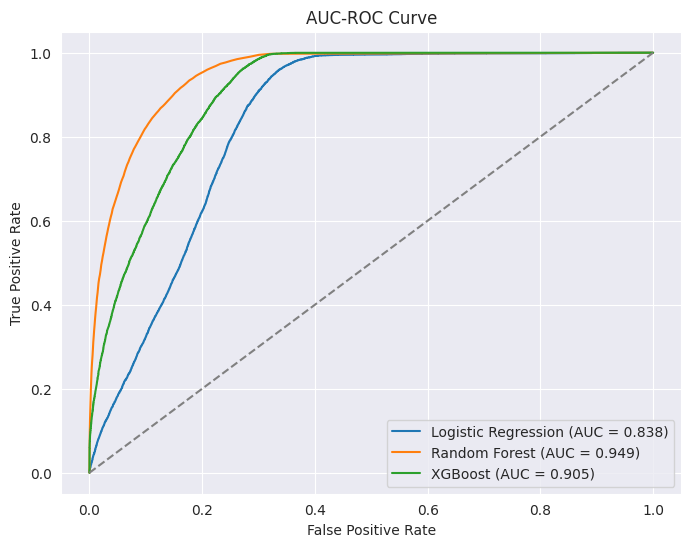

In [80]:
# **6️⃣ Define Models**
models = {
    "Logistic Regression": LogisticRegression(class_weight="balanced", random_state=42),
    "Random Forest": RandomForestClassifier(n_estimators=100, class_weight="balanced", random_state=42),
    "XGBoost": XGBClassifier(use_label_encoder=False, eval_metric="logloss", scale_pos_weight=y_train.value_counts()[0] / y_train.value_counts()[1])
}

# **7️⃣ Train & Evaluate Each Model**
best_model = None
best_auc = 0
results = {}

plt.figure(figsize=(8, 6))
for name, model in models.items():
    print(f"🔹 Training {name}...")
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    y_prob = model.predict_proba(X_test)[:, 1]

    # **Metrics**
    accuracy = accuracy_score(y_test, y_pred)
    auc = roc_auc_score(y_test, y_prob)
    report = classification_report(y_test, y_pred)

    # Store results
    results[name] = {
        "Accuracy": accuracy,
        "AUC": auc,
        "Report": report
    }

    # Select best model based on AUC
    if auc > best_auc:
        best_auc = auc
        best_model = model

    # **AUC-ROC Curve**
    fpr, tpr, _ = roc_curve(y_test, y_prob)
    plt.plot(fpr, tpr, label=f"{name} (AUC = {auc:.3f})")


# **9️⃣ Confusion Matrix for Best Model**
best_model_name = [name for name, model in models.items() if model == best_model][0]
print(f"\n🎯 Best Model: {best_model_name} (AUC = {best_auc:.3f})")

plt.plot([0, 1], [0, 1], linestyle="--", color="gray")
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("AUC-ROC Curve")
plt.legend()
plt.show()
